In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Import librries 
import pandas as pd
import glob
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline
from datetime import datetime
import warnings
import itertools
import numpy as np
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from math import sqrt
from prophet import Prophet
warnings.filterwarnings("ignore")
import plotly.express as px
import seaborn as sns
import seaborn as sb
import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline
from datetime import datetime
import warnings
import itertools
import numpy as np
from statsmodels.tsa.stattools import adfuller
ffrom sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from math import sqrt
from prophet import Prophet
warnings.filterwarnings("ignore")
import plotly.offline
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dense, Dropout, LSTM
import numpy
import keras.models
import tensorflow
from keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
import matplotlib.pyplot
from matplotlib import pyplot

##**Data Reading and Additional Processing**

(524184, 11)
(233039, 11)
(757223, 11)
['DE' 'US']
['pm10' 'pm25']
parameter    city                        utc   latitude  longitude  pm10  pm25
0          Berlin  2020-05-01T00:00:00+00:00  52.438115  13.387720  6.94   NaN
1          Berlin  2020-05-01T00:00:00+00:00  52.463611  13.318250  7.02   NaN
2          Berlin  2020-05-01T00:00:00+00:00  52.467534  13.441654  7.64   NaN
3          Berlin  2020-05-01T00:00:00+00:00  52.473192  13.225144  5.99   NaN
4          Berlin  2020-05-01T00:00:00+00:00  52.481709  13.433967  6.95   NaN
(22254, 6)
(220179, 13)
(166395, 17)
latitude                                                0
longitute                                               0
Year                                                    0
Month                                                   0
Day                                                     0
Hour                                                    0
nitrogendioxide_tropospheric_column                     0
nitrogendioxide_

Text(0.5, 1.0, 'Particulate Matter')

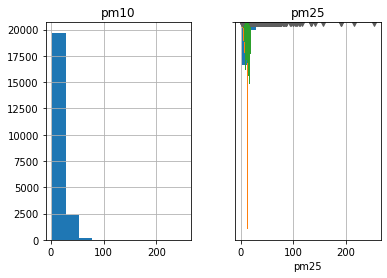

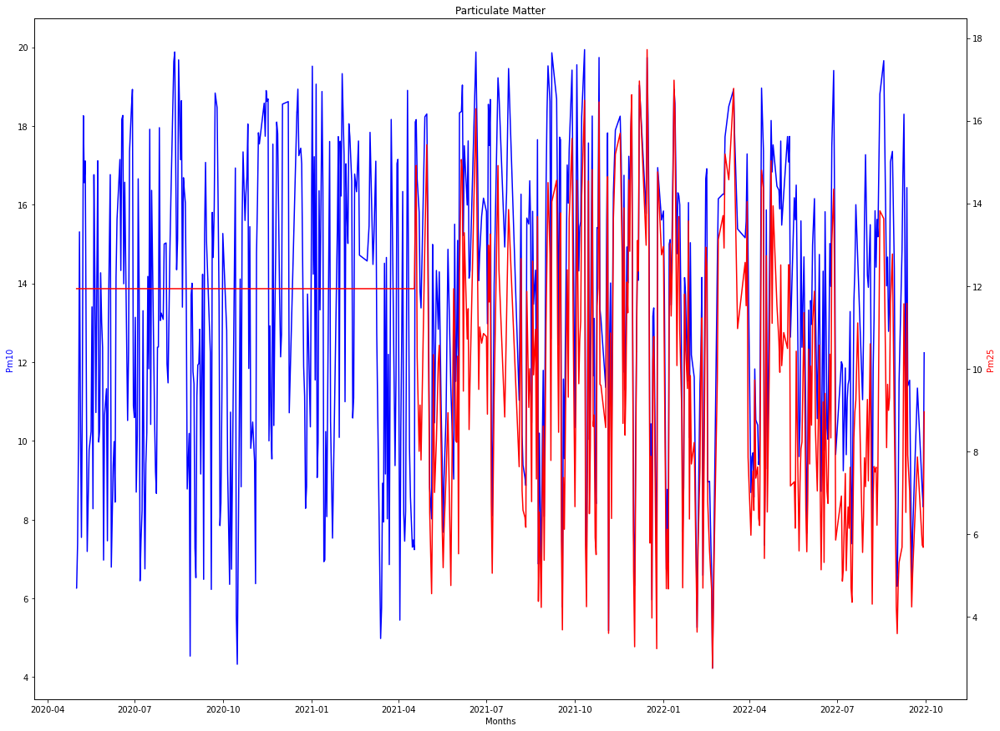

In [ ]:
#This script combines all teh ground level and sattelite files 

# all_files = glob.glob('/content/gdrive/MyDrive/Sent/Ground/' +"*.csv")
# all_files_1 = glob.glob('/content/gdrive/MyDrive/Sent/Ground1/' +"*.csv")
# li = []
# for filename in all_files:
#   df= pd.read_csv(filename, index_col=None, header=0)
#   li.append(df)

# df = pd.concat(li, ignore_index=True)
# li1 = []
# for filename in all_files_1:
#   df1= pd.read_csv(filename, index_col=None, header=0)
#   li1.append(df1)

# df1 = pd.concat(li1, ignore_index=True)
# data10= pd.concat([df,df1])
# print(df.shape)
# print(df1.shape)
# print(data10.shape)
# print(data10['country'].unique())
# data10 = data10.loc[(data10['country'] == 'DE')]
# print(data10['parameter'].unique())
# table = pd.pivot_table(data10, values='value', index=['city','utc','latitude','longitude'],columns=['parameter'])
# table = table.reset_index()
# print(table.head(5))
# print(table.shape)

# table[table.isna().any(axis=1)]
# air_data_ground = table.fillna(table.mean())
# air_data_ground[['pm10', 'pm25']].hist()
# sns.boxplot(x=air_data_ground['pm10'], palette="Oranges")
# sns.boxplot(x=air_data_ground['pm25'], palette="Reds")
# air_data_ground = air_data_ground.loc[(air_data_ground['pm10'] < 20) & (air_data_ground['pm25'] < 20)]
# sns.boxplot(x=air_data_ground['pm25'])
# #air_data_ground = air_data_ground.loc[(air_data_ground['utc'] >= '2020-05-01') & (air_data_ground['utc'] <= '2022-09-31')]
# air_data_ground["utc"] = pd.to_datetime(air_data_ground["utc"]).dt.normalize()
# air_data_ground["utc"] = pd.to_datetime(air_data_ground["utc"]).dt.tz_localize(None)
# air_data_ground=air_data_ground.groupby('utc')[['pm10', 'pm25']].mean()
# air_data_ground = air_data_ground.reset_index()
# air_data_ground 


# df0 = pd.read_csv('/content/gdrive/MyDrive/Sent/May20-Aug21_data.csv')
# df1 = pd.read_csv('/content/gdrive/MyDrive/Sent/Sept2021_data.csv')
# df2 = pd.read_csv('/content/gdrive/MyDrive/Sent/Oct2021_data.csv')
# df3 = pd.read_csv('/content/gdrive/MyDrive/Sent/Nov2021_data.csv')
# df4 = pd.read_csv('/content/gdrive/MyDrive/Sent/Dec2021_data.csv')
# df5 = pd.read_csv('/content/gdrive/MyDrive/Sent/Jan2022_data.csv')
# df6 = pd.read_csv('/content/gdrive/MyDrive/Sent/Feb22-Sep22_data.csv')


# franme_1 = [df0, df1, df2, df3, df4, df5, df6]
# final_data= pd.concat(franme_1)
# print(final_data.shape)
# final_data['utc'] = pd.to_datetime(final_data[['Year', 'Month', 'Day']], format = '%Y-%M-%D').dt.tz_localize(None)
# final_data['date'] = pd.to_datetime(final_data[['Year', 'Month', 'Day', 'Hour']], format = '%Y-%M-%D').dt.tz_localize(None)
# air_data_ground["utc"] = pd.to_datetime(air_data_ground["utc"], format = '%Y-%M-%D')
# test = pd.merge(air_data_ground['utc'],final_data, on='utc', how='outer').dropna(axis = 0)
# fin_data = pd.merge(final_data, 
#                       air_data_ground, 
#                       on ='utc', 
#                       how ='inner')
# print(fin_data.shape)
# print(fin_data.isnull().sum(axis = 0))
# fin_data.to_csv('/content/gdrive/MyDrive/Sent/final_data_May20_Sept22.csv', index=False) 

# fig = px.line(data_frame=fin_data,y='nitrogendioxide_tropospheric_column', x='date')
# #fig.update_layout({'yaxis': {'range': [0.1, 100]},'xaxis': {'range': [0.1, 100]}})
# fig['layout'].pop('updatemenus')
# #fig.update_layout(title='Plot2: Analyst Category Label Proportion per Partition')
# fig.show()

# fig = px.line(data_frame=fin_data,y='air_mass_factor_troposphere', x='date')
# fig.update_traces(line_color='#147852')
# #fig.update_layout({'yaxis': {'range': [0.1, 100]},'xaxis': {'range': [0.1, 100]}})
# fig['layout'].pop('updatemenus')
# #fig.update_layout(title='Plot2: Analyst Category Label Proportion per Partition')
# fig.show()

# fig = px.line(data_frame=fin_data,y='pm10', x='date')
# fig.update_traces(line_color='#456987')
# #fig.update_layout({'yaxis': {'range': [0.1, 100]},'xaxis': {'range': [0.1, 100]}})
# fig['layout'].pop('updatemenus')
# #fig.update_layout(title='Plot2: Analyst Category Label Proportion per Partition')
# fig.show()

# #fig, ax = plt.subplots(2,1,figsize = (20, 20))
# fig, ax = plt.subplots(figsize = (20, 15))
# ax.plot(fin_data['date'], fin_data['pm10'], color='blue')
# ax.set_xlabel('Months')
# ax.set_ylabel('Pm10', color='blue')
# #ax[0].set_ylim([500, 8000])

# ax2 = ax.twinx()
# ax2.plot(fin_data['date'], fin_data['pm25'],color='red')

# ax2.set_ylabel('Pm25', color='red')
# #ax2.set_ylim([500, 8000])
# plt.title('Particulate Matter')

In [ ]:
fin_data = pd.read_csv('/content/gdrive/MyDrive/Sent/final_data_May20_Sept22.csv')

In [ ]:
fin_data.head(5)

,latitude,longitute,Year,Month,Day,Hour,nitrogendioxide_tropospheric_column,nitrogendioxide_tropospheric_column_precision,nitrogendioxide_tropospheric_column_precision_kernel,air_mass_factor_troposphere,air_mass_factor_total,tm5_tropopause_layer_index,qa_value,utc,date,pm10,pm25
0,52.157350,13.716069,2020.0,5.0,1.0,11.0,1.459978e-05,0.000018,0.000017,0.952377,1.804340,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496
1,52.192528,13.806399,2020.0,5.0,1.0,11.0,-6.227974e-06,0.000014,0.000014,0.951523,1.798625,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496
2,52.227226,13.895948,2020.0,5.0,1.0,11.0,5.757178e-07,0.000013,0.000013,0.918600,1.780306,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496
3,52.167213,13.589217,2020.0,5.0,1.0,11.0,1.580315e-05,0.000011,0.000011,1.077755,1.861350,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496
4,52.202910,13.680410,2020.0,5.0,1.0,11.0,1.687531e-05,0.000016,0.000015,1.005521,1.828623,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496


(220179, 15)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


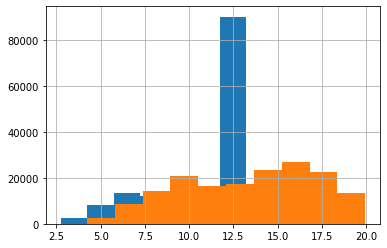

In [ ]:
print(final_data.shape)
print(fin_data['pm25'].hist())
print(fin_data['pm10'].hist())

In [ ]:
fin_data.shape

(166395, 17)

In [ ]:
fin_data['qa_value'].unique()

array([0.0074, 0.01  , 0.0011, 0.0067, 0.009 , 0.0033, 0.0015, 0.0045,
       0.003 , 0.0014, 0.0005, 0.001 , 0.0073])

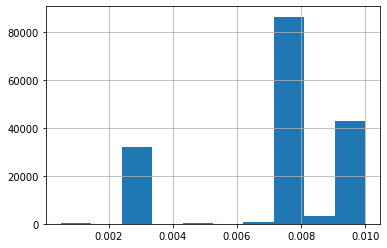

In [ ]:
fin_data['qa_value'].hist()

In [ ]:
fin_data = fin_data.loc[(fin_data['qa_value'] > 0.004)]

In [ ]:
fin_data.shape

(133820, 17)

In [ ]:
fin_data.sort_values(by='date', inplace=True)
fin_data.head()

,latitude,longitute,Year,Month,Day,Hour,nitrogendioxide_tropospheric_column,nitrogendioxide_tropospheric_column_precision,nitrogendioxide_tropospheric_column_precision_kernel,air_mass_factor_troposphere,air_mass_factor_total,tm5_tropopause_layer_index,qa_value,utc,date,pm10,pm25
0,52.157350,13.716069,2020.0,5.0,1.0,11.0,1.459978e-05,0.000018,0.000017,0.952377,1.804340,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496
95,52.548504,13.041852,2020.0,5.0,1.0,11.0,1.250596e-05,0.000011,0.000011,1.022428,1.844749,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496
96,52.585503,13.135360,2020.0,5.0,1.0,11.0,-4.180619e-07,0.000011,0.000011,0.921338,1.783975,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496
97,52.621986,13.228033,2020.0,5.0,1.0,11.0,8.273078e-06,0.000012,0.000012,0.999683,1.816041,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496
98,52.657963,13.319888,2020.0,5.0,1.0,11.0,1.682993e-05,0.000014,0.000013,0.921474,1.775496,14.0,0.0074,2020-05-01,2020-05-01 11:00:00,6.2615,11.934496


In [ ]:
data_LSTM_test1=fin_data.drop(columns=['date', 'utc', 'pm25','tm5_tropopause_layer_index', 'latitude', 'longitute', 'Year', 'Month', 'Day', 'Hour', 'qa_value'])

In [ ]:
data_LSTM_test1.head(5)

,nitrogendioxide_tropospheric_column,nitrogendioxide_tropospheric_column_precision,nitrogendioxide_tropospheric_column_precision_kernel,air_mass_factor_troposphere,air_mass_factor_total,pm10
0,1.459978e-05,0.000018,0.000017,0.952377,1.804340,6.2615
95,1.250596e-05,0.000011,0.000011,1.022428,1.844749,6.2615
96,-4.180619e-07,0.000011,0.000011,0.921338,1.783975,6.2615
97,8.273078e-06,0.000012,0.000012,0.999683,1.816041,6.2615
98,1.682993e-05,0.000014,0.000013,0.921474,1.775496,6.2615


##**Feature Engineering fro LSTM**

In [ ]:
# prepare data for lstm

#The model scrip was adopted from the following page: https://machinelearningmastery.com/multivariate-time-series-forecasting-lstms-keras/

from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
 
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg
 
# load dataset
#dataset = read_csv('pollution.csv', header=0, index_col=0)
values = data_LSTM_test1.values
# integer encode direction
encoder = LabelEncoder()
#values[:,8] = encoder.fit_transform(values[:,8])
values
# ensure all data is float
values = values.astype('float32')
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# frame as supervised learning
reframed = series_to_supervised(scaled, 1, 1)
reframed.drop(reframed.columns[[0,6, 8,9,10,11]], axis=1, inplace=True)
print(reframed.head())

   var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)   var2(t)
1   0.018191   0.018763   0.243149   0.357339   0.129479  0.008212
2   0.008212   0.008622   0.266456   0.371345   0.129479  0.008405
3   0.008405   0.009252   0.232822   0.350280   0.129479  0.009880
4   0.009880   0.010570   0.258888   0.361394   0.129479  0.012215
5   0.012215   0.012459   0.232868   0.347342   0.129479  0.009161


In [ ]:
#Train/Val?test
values = reframed.values
x, x_test, y, y_test = train_test_split(values[:, :-1],values[:,-1],test_size=0.1,train_size=0.9, random_state=None, shuffle=False)
x_train, x_val, train_y, val_y = train_test_split(x,y,test_size = 0.2,train_size =0.8, random_state=None, shuffle=False)

In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = x_train.reshape((x_train.shape[0], 1, x_train.shape[1])) 
val_X = x_val.reshape((x_val.shape[0], 1, x_val.shape[1]))
test_X = x_test.reshape((x_test.shape[0], 1, x_test.shape[1]))

In [ ]:
print(train_X.shape, train_y.shape, val_X.shape, val_y.shape, test_X.shape, y_test.shape)

(96349, 1, 5) (96349,) (24088, 1, 5) (24088,) (13382, 1, 5) (13382,)


In [ ]:
val_y

array([0.05105685, 0.05416616, 0.04020974, ..., 0.00888138, 0.00888108,
       0.01107289], dtype=float32)

##** LSTM Baseline**

Epoch 1/15
1506/1506 - 39s - loss: 0.0102 - val_loss: 0.0103 - 39s/epoch - 26ms/step
Epoch 2/15
1506/1506 - 29s - loss: 0.0092 - val_loss: 0.0106 - 29s/epoch - 19ms/step
Epoch 3/15
1506/1506 - 29s - loss: 0.0090 - val_loss: 0.0110 - 29s/epoch - 19ms/step
Epoch 4/15
1506/1506 - 29s - loss: 0.0089 - val_loss: 0.0110 - 29s/epoch - 19ms/step
Epoch 5/15
1506/1506 - 29s - loss: 0.0088 - val_loss: 0.0109 - 29s/epoch - 19ms/step
Epoch 6/15
1506/1506 - 28s - loss: 0.0087 - val_loss: 0.0110 - 28s/epoch - 18ms/step
Epoch 7/15
1506/1506 - 28s - loss: 0.0087 - val_loss: 0.0108 - 28s/epoch - 18ms/step
Epoch 8/15
1506/1506 - 28s - loss: 0.0087 - val_loss: 0.0111 - 28s/epoch - 19ms/step
Epoch 9/15
1506/1506 - 28s - loss: 0.0087 - val_loss: 0.0108 - 28s/epoch - 18ms/step
Epoch 10/15
1506/1506 - 28s - loss: 0.0086 - val_loss: 0.0109 - 28s/epoch - 18ms/step
Epoch 11/15
1506/1506 - 31s - loss: 0.0086 - val_loss: 0.0110 - 31s/epoch - 21ms/step
Epoch 12/15
1506/1506 - 28s - loss: 0.0086 - val_loss: 0.0108 -

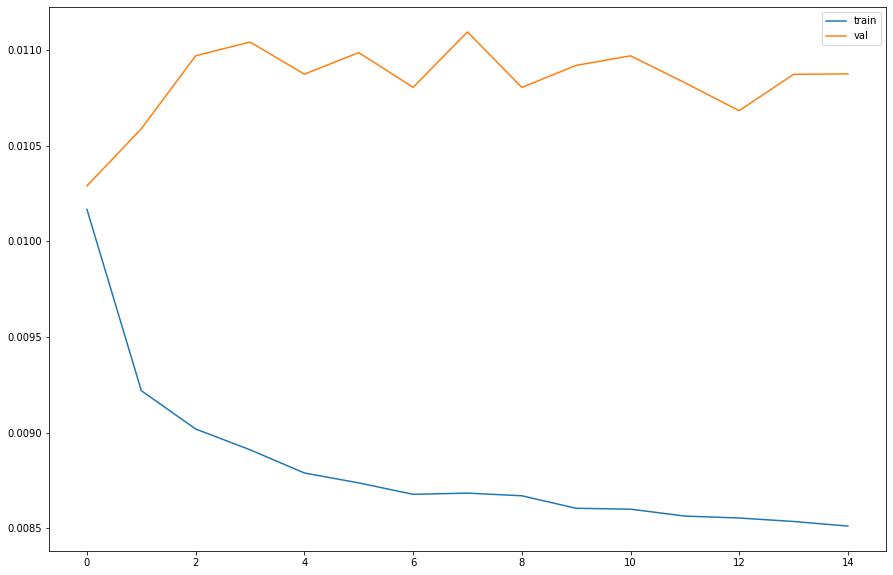

CPU times: user 11min 55s, sys: 27.3 s, total: 12min 22s
Wall time: 7min 18s


In [ ]:
%%time

model = Sequential()
model.add(LSTM(500, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam') #mean absolute error 

#add cross validation, training (model weights), hyprparamter training (optimise the model), and validation (test), split should be reasoanble
#fundtionc 1: train get the weights 
# fit network, 2: use weights on the hyperparameter, return efficacy 2: optimised parameters 3: test on the validation 
history = model.fit(train_X, train_y, epochs=15, batch_size=64, validation_data=(val_X, val_y), verbose=2, shuffle=False)
# plot history
plt.figure(figsize=(15, 10))

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.show()

#plot the training/validation set , plot all the sets together in one image 

#visulisation during that time period, s LSTM is aggregated, visualisation from grid , random days from, and present to capture the lSTM general effects in geograhical sense, can a visualisation help to inform LSTM ? 

753/753 [==============================] - 4s 5ms/step


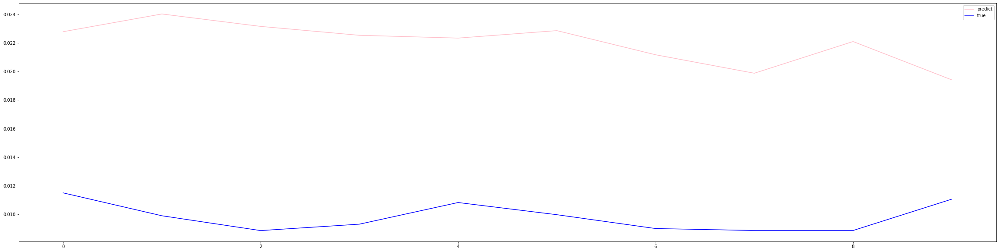

In [ ]:
yhat = model.predict(val_X)
plt.figure(figsize=(40, 10))
pyplot.plot(yhat[-10:], label='predict', color = 'pink')
pyplot.plot(val_y[-10:], label='true', color = 'blue')
pyplot.legend()

pyplot.show()

3011/3011 [==============================] - 15s 5ms/step


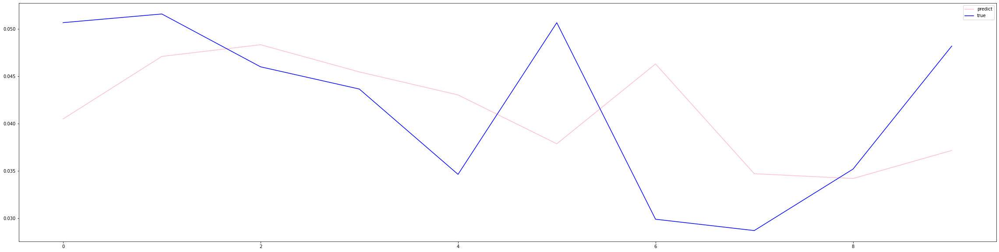

In [ ]:
yhat = model.predict(train_X)
plt.figure(figsize=(40, 10))
pyplot.plot(yhat[-10:], label='predict', color = 'pink')
pyplot.plot(train_y[-10:], label='true', color = 'blue')
pyplot.legend()

pyplot.show()

419/419 [==============================] - 2s 6ms/step


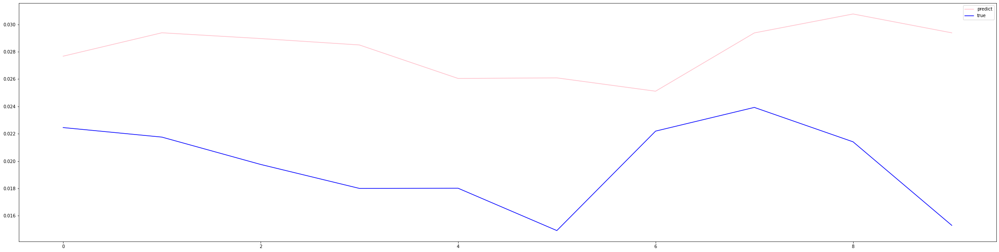

In [ ]:
yhat = model.predict(test_X)
plt.figure(figsize=(40, 10))
pyplot.plot(yhat[-10:], label='predict', color = 'pink')
pyplot.plot(y_test[-10:], label='true', color = 'blue')
pyplot.legend()

pyplot.show()